上游代码：`ControlSim3D.py`

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.ticker import MultipleLocator
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
import plotly.graph_objs as go
import plotly.io as pio
from mayavi import mlab
import imageio

# 在 Jupyter Notebook 中启用图表显示
pio.renderers.default = 'notebook'
mlab.init_notebook(backend='ipy', width=None, height=None, local=True)

# 设置全局字体为 Times New Roman
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'

Notebook initialized with ipy backend.


In [2]:
num:int = 1
loss_np = np.loadtxt(f"loss{num}.csv", delimiter=',')
marker_pos_np = np.loadtxt(f"marker_pos{num}.csv", delimiter=',')
contact_pos_np = np.loadtxt(f"contact_pos{num}.csv", delimiter=',')
node_pos = np.loadtxt(f"node_pos_final{num}.csv", delimiter=',')

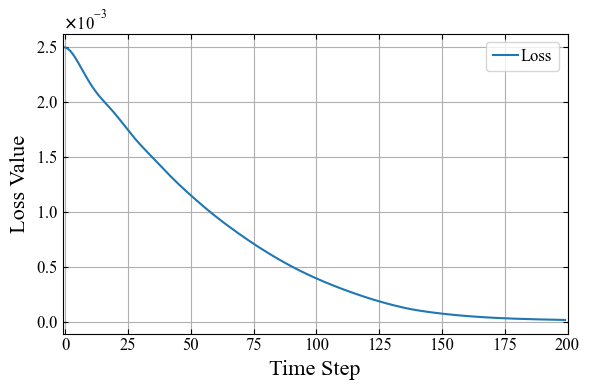

In [3]:
fig = plt.figure(figsize=(6, 4), dpi=100)
gs = GridSpec(1, 1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(loss_np, label='Loss', color='tab:blue')
ax.set_xlabel('Time Step', fontsize=16)
ax.set_ylabel('Loss Value', fontsize=16)

ax.set_xlim([-1, len(loss_np)])
# ax.xaxis.set_major_locator(MultipleLocator(np.pi / 10))
ax.ticklabel_format(axis='y', style='sci', scilimits=(-1, 1), useLocale=False, useMathText=True)            # 科学计数法
ax.yaxis.offsetText.set_fontsize(12)
ax.tick_params(axis='both', labelsize=12, direction='in', top=True, right=True)

ax.legend(handlelength=1.5, handletextpad=0.2, labelspacing=0.2, loc='upper right', fontsize=12, bbox_to_anchor=(1, 1), bbox_transform=ax.transAxes)
ax.grid(True, zorder=0)

plt.tight_layout()

In [4]:
# 创建 3D 轨迹图
trace_1 = go.Scatter3d(
    x=contact_pos_np[:, 0],
    y=contact_pos_np[:, 1],
    z=contact_pos_np[:, 2],
    mode='lines',
    line=dict(color='blue', width=4)
)

trace_2 = go.Scatter3d(
    x=contact_pos_np[:, 3],
    y=contact_pos_np[:, 4],
    z=contact_pos_np[:, 5],
    mode='lines',
    line=dict(color='red', width=4)
)

# 设置布局
layout = go.Layout(
    title='3D Trajectory',
    scene=dict(
        xaxis_title='X Axis',
        yaxis_title='Y Axis',
        zaxis_title='Z Axis'
    )
)

# 创建图形
fig = go.Figure(data=[trace_1, trace_2], layout=layout)
fig.update_layout(autosize=False, width=800, height=600)

# 显示图形
fig.show()


---
固定一侧两个节点，机器人末端固连另一侧四个节点，只对机器人施加动作
learning_rate=2.e1; max_action=2.e-3

In [44]:
num:int = 2
loss_np = np.loadtxt(f"loss{num}.csv", delimiter=',')
marker_pos_np = np.loadtxt(f"marker_pos{num}.csv", delimiter=',')
contact_pos_np = np.loadtxt(f"contact_pos{num}.csv", delimiter=',')
node_pos = np.loadtxt(f"node_pos_final{num}.csv", delimiter=',')

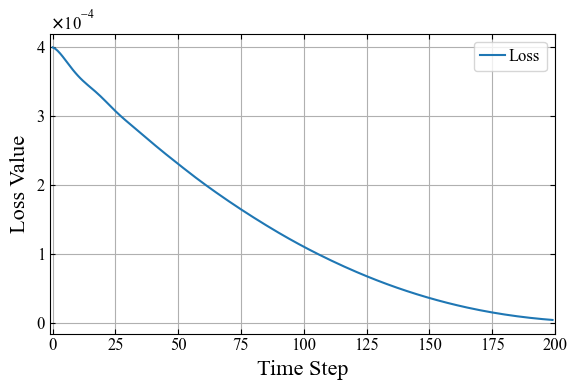

In [45]:
fig = plt.figure(figsize=(6, 4), dpi=100)
gs = GridSpec(1, 1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(loss_np, label='Loss', color='tab:blue')
ax.set_xlabel('Time Step', fontsize=16)
ax.set_ylabel('Loss Value', fontsize=16)

ax.set_xlim([-1, len(loss_np)])
# ax.xaxis.set_major_locator(MultipleLocator(np.pi / 10))
ax.ticklabel_format(axis='y', style='sci', scilimits=(-1, 1), useLocale=False, useMathText=True)            # 科学计数法
ax.yaxis.offsetText.set_fontsize(12)
ax.tick_params(axis='both', labelsize=12, direction='in', top=True, right=True)

ax.legend(handlelength=1.5, handletextpad=0.2, labelspacing=0.2, loc='upper right', fontsize=12, bbox_to_anchor=(1, 1), bbox_transform=ax.transAxes)
ax.grid(True, zorder=0)

plt.tight_layout()

In [62]:
# 创建 3D 轨迹图
trace_10 = go.Scatter3d(x=contact_pos_np[:, 0], y=contact_pos_np[:, 1], z=contact_pos_np[:, 2], mode='lines', name='Trajectory', line=dict(color='black', width=4), legendgroup='group1')
trace_11 = go.Scatter3d(x=contact_pos_np[:, 3], y=contact_pos_np[:, 4], z=contact_pos_np[:, 5], mode='lines', name='Trajectory', legendgroup='group1', line=dict(color='black', width=4))
trace_12 = go.Scatter3d(x=contact_pos_np[:, 6], y=contact_pos_np[:, 7], z=contact_pos_np[:, 8], mode='lines', name='Trajectory', legendgroup='group1', line=dict(color='black', width=4))
trace_13 = go.Scatter3d(x=contact_pos_np[:, 9], y=contact_pos_np[:, 10], z=contact_pos_np[:, 11], mode='lines', name='Trajectory', legendgroup='group1', line=dict(color='black', width=4))

end_points = contact_pos_np[-1,:].reshape(-1, 3)
start_points = contact_pos_np[0,:].reshape(-1, 3)
start_scatter = go.Scatter3d(x=start_points[:, 0], y=start_points[:, 1], z=start_points[:, 2], mode='markers', name='Start Points', marker=dict(color='red', size=5, symbol='circle'))
end_sactter = go.Scatter3d(x=end_points[:, 0], y=end_points[:, 1], z=end_points[:, 2], mode='markers', name='End Points', marker=dict(color='blue', size=5, symbol='diamond'))

# 设置布局
layout = go.Layout(title='3D Trajectory', scene=dict(xaxis_title='X Axis', yaxis_title='Y Axis', zaxis_title='Z Axis'))

# 创建图形
fig = go.Figure(data=[trace_10, trace_11, trace_12, trace_13], layout=layout)
fig.add_trace(start_scatter)
fig.add_trace(end_sactter)
fig.update_layout(autosize=False, xaxis=dict(scaleanchor="y", scaleratio=1), yaxis=dict(scaleanchor="x", scaleratio=1), width=800, height=600)

# 显示图形
fig.show()

---
设置了接触节点和fixed节点对应的element的weight为1.e4

Fixed nodes = [206, 207, 208, 209] + [228, 229, 230, 231]; Contact nodes = [10, 11, 12, 13] + [32, 33, 34, 35]

learning_rate=2.e1; max_action=2.e-3

In [73]:
num:int = 3
loss_np = np.loadtxt(f"loss{num}.csv", delimiter=',')
marker_pos_np = np.loadtxt(f"marker_pos{num}.csv", delimiter=',')
contact_pos_np = np.loadtxt(f"contact_pos{num}.csv", delimiter=',')
node_pos = np.loadtxt(f"node_pos_final{num}.csv", delimiter=',')

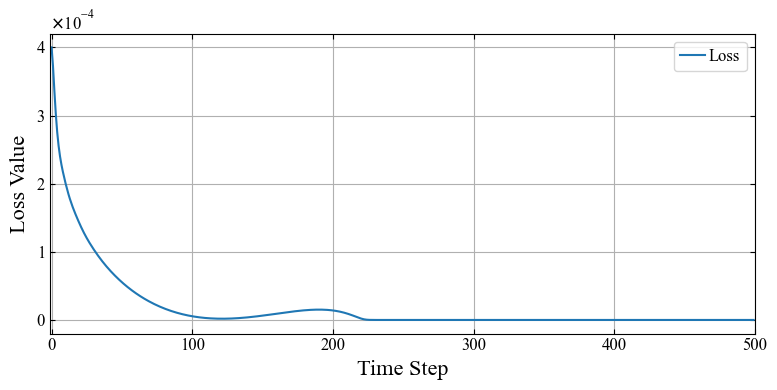

In [75]:
fig = plt.figure(figsize=(8, 4), dpi=100)
gs = GridSpec(1, 1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(loss_np, label='Loss', color='tab:blue')
ax.set_xlabel('Time Step', fontsize=16)
ax.set_ylabel('Loss Value', fontsize=16)

ax.set_xlim([-1, len(loss_np)])
# ax.xaxis.set_major_locator(MultipleLocator(np.pi / 10))
ax.ticklabel_format(axis='y', style='sci', scilimits=(-1, 1), useLocale=False, useMathText=True)            # 科学计数法
ax.yaxis.offsetText.set_fontsize(12)
ax.tick_params(axis='both', labelsize=12, direction='in', top=True, right=True)

ax.legend(handlelength=1.5, handletextpad=0.2, labelspacing=0.2, loc='upper right', fontsize=12, bbox_to_anchor=(1, 1), bbox_transform=ax.transAxes)
ax.grid(True, zorder=0)

plt.tight_layout()

In [88]:
# 创建 3D 轨迹图
trace_list = []
for i in range(contact_pos_np.shape[1]//3):
    trace_list.append(go.Scatter3d(x=contact_pos_np[:, i*3], y=contact_pos_np[:, i*3+1], z=contact_pos_np[:, i*3+2], mode='lines', line=dict(color='black', width=4)))

end_points = contact_pos_np[-1,:].reshape(-1, 3)
start_points = contact_pos_np[0,:].reshape(-1, 3)
start_scatter = go.Scatter3d(x=start_points[:, 0], y=start_points[:, 1], z=start_points[:, 2], mode='markers', name='Start Points', marker=dict(color='red', size=5, symbol='circle'))
end_sactter = go.Scatter3d(x=end_points[:, 0], y=end_points[:, 1], z=end_points[:, 2], mode='markers', name='End Points', marker=dict(color='blue', size=5, symbol='diamond'))

contact_pos_reshape = contact_pos_np.reshape(-1, contact_pos_np.shape[1]//3, 3)
center_pos = np.mean(contact_pos_reshape, axis=1)
center_trace = go.Scatter3d(x=center_pos[:, 0], y=center_pos[:, 1], z=center_pos[:, 2], mode='lines', name='Center Points', line=dict(color='green', width=4))

# 设置布局
layout = go.Layout(title='3D Trajectory', scene=dict(xaxis_title='X Axis', yaxis_title='Y Axis', zaxis_title='Z Axis'))

# 创建图形
fig = go.Figure(data=trace_list, layout=layout)
fig.add_traces(data=[start_scatter, end_sactter, center_trace])
fig.update_layout(autosize=False, xaxis=dict(scaleanchor="y", scaleratio=1), yaxis=dict(scaleanchor="x", scaleratio=1), width=800, height=600)

# 显示图形
fig.show()

In [97]:
marker_trace = go.Scatter3d(x=marker_pos_np[:,0], y=marker_pos_np[:,1], z=marker_pos_np[:,2], mode='lines', line=dict(color='red', width=4))
layout = go.Layout(title='3D Trajectory', scene=dict(xaxis_title='X Axis', yaxis_title='Y Axis', zaxis_title='Z Axis'))

# 创建图形
fig = go.Figure(layout=layout)
fig.add_traces(data=[marker_trace])
fig.update_layout(autosize=False, width=800, height=600)
fig.update_scenes(aspectmode='cube', aspectratio=dict(x=1, y=1, z=1))

# 显示图形
fig.show()

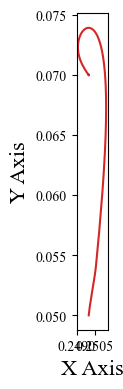

In [114]:
fig = plt.figure(figsize=(8, 4), dpi=100)
gs = GridSpec(1, 1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(marker_pos_np[:,0], marker_pos_np[:,2], label='Marker', color='tab:red')

ax.set_xlabel('X Axis', fontsize=16)
ax.set_ylabel('Y Axis', fontsize=16)
# ax.ticklabel_format(axis='x', style='sci', scilimits=(-1, 1), useLocale=False, useMathText=True)
ax.xaxis.set_major_locator(plt.MaxNLocator(2))
ax.set_aspect('equal', adjustable='box')

fig.tight_layout()

出现比较明显的震荡情况，考虑之后不再对element weight进行单独设置

---
Fixed nodes = [206, 207, 208, 209] + [228, 229, 230, 231]; Contact nodes = [10, 11, 12, 13] + [32, 33, 34, 35]; Desired pos=+[0., 0., 0.05]

learning_rate=5.e-1; max_action=8.e-3

In [152]:
num:int = 4
loss_np = np.loadtxt(f"loss{num}.csv", delimiter=',')
marker_pos_np = np.loadtxt(f"marker_pos{num}.csv", delimiter=',')
contact_pos_np = np.loadtxt(f"contact_pos{num}.csv", delimiter=',')
node_pos = np.loadtxt(f"node_pos_final{num}.csv", delimiter=',')

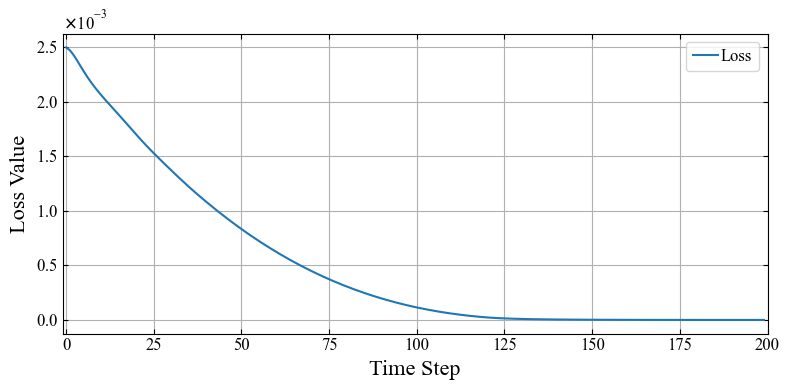

In [153]:
fig = plt.figure(figsize=(8, 4), dpi=100)
gs = GridSpec(1, 1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(loss_np, label='Loss', color='tab:blue')
ax.set_xlabel('Time Step', fontsize=16)
ax.set_ylabel('Loss Value', fontsize=16)

ax.set_xlim([-1, len(loss_np)])
# ax.xaxis.set_major_locator(MultipleLocator(np.pi / 10))
ax.ticklabel_format(axis='y', style='sci', scilimits=(-1, 1), useLocale=False, useMathText=True)            # 科学计数法
ax.yaxis.offsetText.set_fontsize(12)
ax.tick_params(axis='both', labelsize=12, direction='in', top=True, right=True)

ax.legend(handlelength=1.5, handletextpad=0.2, labelspacing=0.2, loc='upper right', fontsize=12, bbox_to_anchor=(1, 1), bbox_transform=ax.transAxes)
ax.grid(True, zorder=0)

plt.tight_layout()

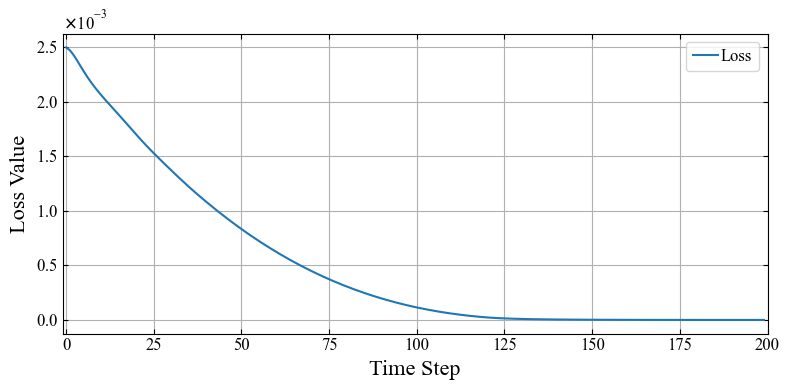

In [ ]:
fig = plt.figure(figsize=(8, 4), dpi=100)
gs = GridSpec(1, 1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(loss_np, label='Loss', color='tab:blue')
ax.set_xlabel('Time Step', fontsize=16)
ax.set_ylabel('Loss Value', fontsize=16)

ax.set_xlim([-1, len(loss_np)])
# ax.xaxis.set_major_locator(MultipleLocator(np.pi / 10))
ax.ticklabel_format(axis='y', style='sci', scilimits=(-1, 1), useLocale=False, useMathText=True)            # 科学计数法
ax.yaxis.offsetText.set_fontsize(12)
ax.tick_params(axis='both', labelsize=12, direction='in', top=True, right=True)

ax.legend(handlelength=1.5, handletextpad=0.2, labelspacing=0.2, loc='upper right', fontsize=12, bbox_to_anchor=(1, 1), bbox_transform=ax.transAxes)
ax.grid(True, zorder=0)

plt.tight_layout()

In [154]:
# 创建 3D 轨迹图
trace_list = []
for i in range(contact_pos_np.shape[1]//3):
    trace_list.append(go.Scatter3d(x=contact_pos_np[:, i*3], y=contact_pos_np[:, i*3+1], z=contact_pos_np[:, i*3+2], mode='lines', line=dict(color='black', width=4)))

end_points = contact_pos_np[-1,:].reshape(-1, 3)
start_points = contact_pos_np[0,:].reshape(-1, 3)
start_scatter = go.Scatter3d(x=start_points[:, 0], y=start_points[:, 1], z=start_points[:, 2], mode='markers', name='Start Points', marker=dict(color='red', size=5, symbol='circle'))
end_sactter = go.Scatter3d(x=end_points[:, 0], y=end_points[:, 1], z=end_points[:, 2], mode='markers', name='End Points', marker=dict(color='blue', size=5, symbol='diamond'))

contact_pos_reshape = contact_pos_np.reshape(-1, contact_pos_np.shape[1]//3, 3)
center_pos = np.mean(contact_pos_reshape, axis=1)
center_trace = go.Scatter3d(x=center_pos[:, 0], y=center_pos[:, 1], z=center_pos[:, 2], mode='lines', name='Center Points', line=dict(color='green', width=4))

# 设置布局
layout = go.Layout(title='3D Trajectory', scene=dict(xaxis_title='X Axis', yaxis_title='Y Axis', zaxis_title='Z Axis'))

# 创建图形
fig = go.Figure(data=trace_list, layout=layout)
fig.add_traces(data=[start_scatter, end_sactter, center_trace])
fig.update_layout(autosize=False, xaxis=dict(scaleanchor="y", scaleratio=1), yaxis=dict(scaleanchor="x", scaleratio=1), width=800, height=600)

# 显示图形
fig.show()

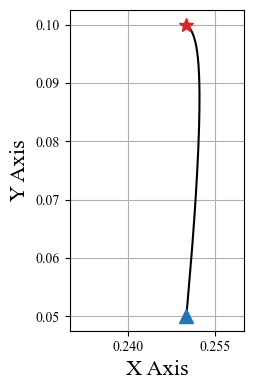

In [168]:
fig = plt.figure(figsize=(8, 4), dpi=100)
gs = GridSpec(1, 1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(marker_pos_np[:,0], marker_pos_np[:,2], label='Marker', color='black')
ax.plot(marker_pos_np[0,0], marker_pos_np[0,2], marker='^', markersize=10, color='tab:blue', label='Start Point')

desired_pos = np.array([0.25, 0.05+0.05])
ax.plot(desired_pos[0], desired_pos[1], marker='*', markersize=10, color='tab:red', label='Desired Position')

ax.set_xlabel('X Axis', fontsize=16)
ax.set_ylabel('Y Axis', fontsize=16)
ax.set_xlim([0.23, 0.26])
# ax.ticklabel_format(axis='x', style='sci', scilimits=(-1, 1), useLocale=False, useMathText=True)
ax.xaxis.set_major_locator(plt.MaxNLocator(2))
ax.set_aspect('equal', adjustable='box')
ax.grid(True, zorder=0)

fig.tight_layout()

---
Desired pos=+[0., 0., -0.03]; self.E, self.nu = 3.e3, 0.3; marker idx=[121]

In [2]:
num:int = 6
loss_np = np.loadtxt(f"loss{num}.csv", delimiter=',')
marker_pos_np = np.loadtxt(f"marker_pos{num}.csv", delimiter=',')
contact_pos_np = np.loadtxt(f"contact_pos{num}.csv", delimiter=',')
node_pos = np.loadtxt(f"node_pos_final{num}.csv", delimiter=',')

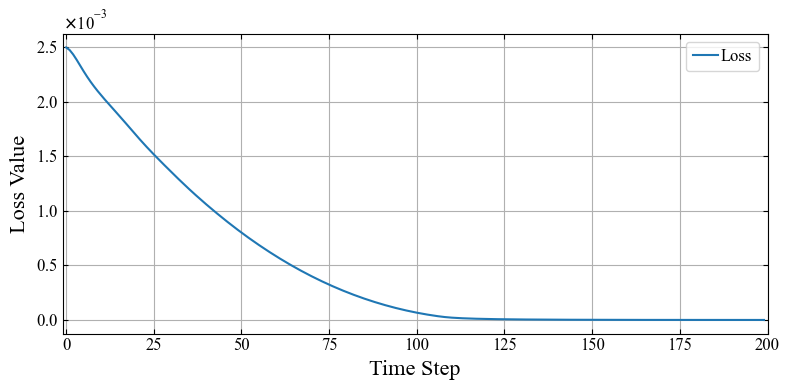

In [3]:
fig = plt.figure(figsize=(8, 4), dpi=100)
gs = GridSpec(1, 1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(loss_np, label='Loss', color='tab:blue')
ax.set_xlabel('Time Step', fontsize=16)
ax.set_ylabel('Loss Value', fontsize=16)

ax.set_xlim([-1, len(loss_np)])
# ax.xaxis.set_major_locator(MultipleLocator(np.pi / 10))
ax.ticklabel_format(axis='y', style='sci', scilimits=(-1, 1), useLocale=False, useMathText=True)            # 科学计数法
ax.yaxis.offsetText.set_fontsize(12)
ax.tick_params(axis='both', labelsize=12, direction='in', top=True, right=True)

ax.legend(handlelength=1.5, handletextpad=0.2, labelspacing=0.2, loc='upper right', fontsize=12, bbox_to_anchor=(1, 1), bbox_transform=ax.transAxes)
ax.grid(True, zorder=0)

plt.tight_layout()

In [4]:
# 创建 3D 轨迹图
trace_list = []
for i in range(contact_pos_np.shape[1]//3):
    trace_list.append(go.Scatter3d(x=contact_pos_np[:, i*3], y=contact_pos_np[:, i*3+1], z=contact_pos_np[:, i*3+2], mode='lines', line=dict(color='black', width=4)))

end_points = contact_pos_np[-1,:].reshape(-1, 3)
start_points = contact_pos_np[0,:].reshape(-1, 3)
start_scatter = go.Scatter3d(x=start_points[:, 0], y=start_points[:, 1], z=start_points[:, 2], mode='markers', name='Start Points', marker=dict(color='red', size=5, symbol='circle'))
end_sactter = go.Scatter3d(x=end_points[:, 0], y=end_points[:, 1], z=end_points[:, 2], mode='markers', name='End Points', marker=dict(color='blue', size=5, symbol='diamond'))

contact_pos_reshape = contact_pos_np.reshape(-1, contact_pos_np.shape[1]//3, 3)
center_pos = np.mean(contact_pos_reshape, axis=1)
center_trace = go.Scatter3d(x=center_pos[:, 0], y=center_pos[:, 1], z=center_pos[:, 2], mode='lines', name='Center Points', line=dict(color='green', width=4))

# 设置布局
layout = go.Layout(title='3D Trajectory', scene=dict(xaxis_title='X Axis', yaxis_title='Y Axis', zaxis_title='Z Axis'))

# 创建图形
fig = go.Figure(data=trace_list, layout=layout)
fig.add_traces(data=[start_scatter, end_sactter, center_trace])
fig.update_layout(autosize=False, xaxis=dict(scaleanchor="y", scaleratio=1), yaxis=dict(scaleanchor="x", scaleratio=1), width=800, height=600)

# 显示图形
fig.show()

---
Desired pos=+[0, 0, 0.03]; self.E, self.nu = 3.e5, 0.3; marker idx=[121]; 设定了所有固连点相关的element weight

In [12]:
num:int = 7
loss_np = np.loadtxt(f"loss{num}.csv", delimiter=',')
marker_pos_np = np.loadtxt(f"marker_pos{num}.csv", delimiter=',')
contact_pos_np = np.loadtxt(f"contact_pos{num}.csv", delimiter=',')
node_pos = np.loadtxt(f"node_pos_final{num}.csv", delimiter=',')

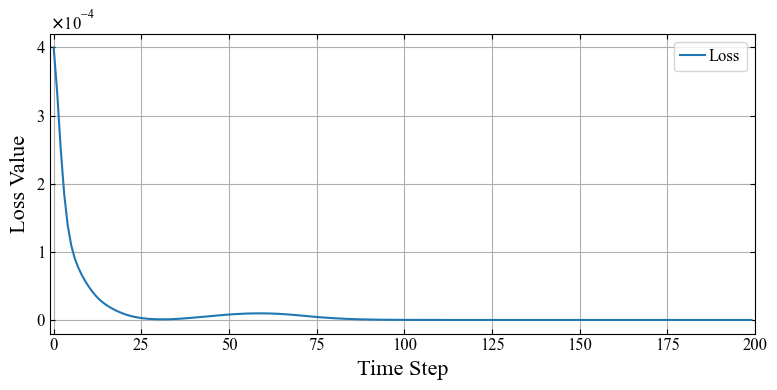

In [13]:
fig = plt.figure(figsize=(8, 4), dpi=100)
gs = GridSpec(1, 1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(loss_np, label='Loss', color='tab:blue')
ax.set_xlabel('Time Step', fontsize=16)
ax.set_ylabel('Loss Value', fontsize=16)

ax.set_xlim([-1, len(loss_np)])
# ax.xaxis.set_major_locator(MultipleLocator(np.pi / 10))
ax.ticklabel_format(axis='y', style='sci', scilimits=(-1, 1), useLocale=False, useMathText=True)            # 科学计数法
ax.yaxis.offsetText.set_fontsize(12)
ax.tick_params(axis='both', labelsize=12, direction='in', top=True, right=True)

ax.legend(handlelength=1.5, handletextpad=0.2, labelspacing=0.2, loc='upper right', fontsize=12, bbox_to_anchor=(1, 1), bbox_transform=ax.transAxes)
ax.grid(True, zorder=0)

plt.tight_layout()

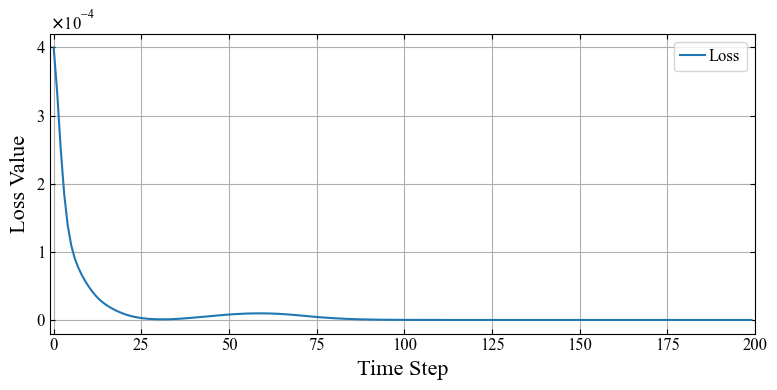

In [ ]:
fig = plt.figure(figsize=(8, 4), dpi=100)
gs = GridSpec(1, 1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(loss_np, label='Loss', color='tab:blue')
ax.set_xlabel('Time Step', fontsize=16)
ax.set_ylabel('Loss Value', fontsize=16)

ax.set_xlim([-1, len(loss_np)])
# ax.xaxis.set_major_locator(MultipleLocator(np.pi / 10))
ax.ticklabel_format(axis='y', style='sci', scilimits=(-1, 1), useLocale=False, useMathText=True)            # 科学计数法
ax.yaxis.offsetText.set_fontsize(12)
ax.tick_params(axis='both', labelsize=12, direction='in', top=True, right=True)

ax.legend(handlelength=1.5, handletextpad=0.2, labelspacing=0.2, loc='upper right', fontsize=12, bbox_to_anchor=(1, 1), bbox_transform=ax.transAxes)
ax.grid(True, zorder=0)

plt.tight_layout()

In [15]:
# 创建 3D 轨迹图
trace_list = []
for i in range(contact_pos_np.shape[1]//3):
    trace_list.append(go.Scatter3d(x=contact_pos_np[:, i*3], y=contact_pos_np[:, i*3+1], z=contact_pos_np[:, i*3+2], mode='lines', line=dict(color='black', width=4)))

end_points = contact_pos_np[-1,:].reshape(-1, 3)
start_points = contact_pos_np[0,:].reshape(-1, 3)
start_scatter = go.Scatter3d(x=start_points[:, 0], y=start_points[:, 1], z=start_points[:, 2], mode='markers', name='Start Points', marker=dict(color='red', size=5, symbol='circle'))
end_sactter = go.Scatter3d(x=end_points[:, 0], y=end_points[:, 1], z=end_points[:, 2], mode='markers', name='End Points', marker=dict(color='blue', size=5, symbol='diamond'))

contact_pos_reshape = contact_pos_np.reshape(-1, contact_pos_np.shape[1]//3, 3)
center_pos = np.mean(contact_pos_reshape, axis=1)
center_trace = go.Scatter3d(x=center_pos[:, 0], y=center_pos[:, 1], z=center_pos[:, 2], mode='lines', name='Center Points', line=dict(color='green', width=4))

# 设置布局
layout = go.Layout(title='3D Trajectory', scene=dict(xaxis_title='X Axis', yaxis_title='Y Axis', zaxis_title='Z Axis'))

# 创建图形
fig = go.Figure(data=trace_list, layout=layout)
fig.add_traces(data=[start_scatter, end_sactter, center_trace])
fig.update_layout(autosize=False, xaxis=dict(scaleanchor="y", scaleratio=1), yaxis=dict(scaleanchor="x", scaleratio=1), width=800, height=600)

# 显示图形
fig.show()

---
Desired pos=+[0, 0, 0.03]; self.E, self.nu = 3.e3, 0.3; marker idx=[121]; 设定了所有固连点相关的element weight

In [16]:
num:int = 8
loss_np = np.loadtxt(f"loss{num}.csv", delimiter=',')
marker_pos_np = np.loadtxt(f"marker_pos{num}.csv", delimiter=',')
contact_pos_np = np.loadtxt(f"contact_pos{num}.csv", delimiter=',')
node_pos = np.loadtxt(f"node_pos_final{num}.csv", delimiter=',')

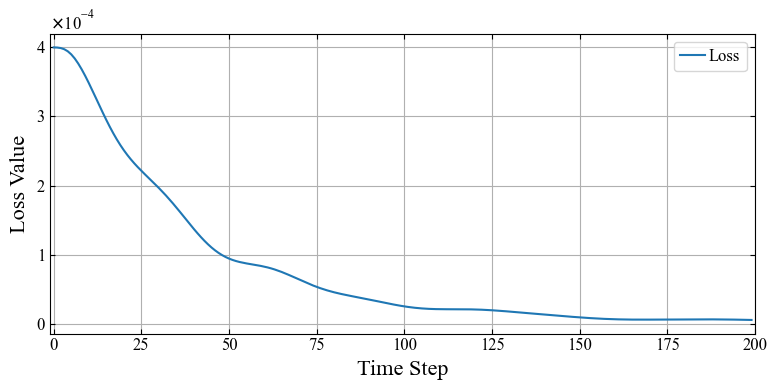

In [17]:
fig = plt.figure(figsize=(8, 4), dpi=100)
gs = GridSpec(1, 1)

ax = fig.add_subplot(gs[0, 0])
ax.plot(loss_np, label='Loss', color='tab:blue')
ax.set_xlabel('Time Step', fontsize=16)
ax.set_ylabel('Loss Value', fontsize=16)

ax.set_xlim([-1, len(loss_np)])
# ax.xaxis.set_major_locator(MultipleLocator(np.pi / 10))
ax.ticklabel_format(axis='y', style='sci', scilimits=(-1, 1), useLocale=False, useMathText=True)            # 科学计数法
ax.yaxis.offsetText.set_fontsize(12)
ax.tick_params(axis='both', labelsize=12, direction='in', top=True, right=True)

ax.legend(handlelength=1.5, handletextpad=0.2, labelspacing=0.2, loc='upper right', fontsize=12, bbox_to_anchor=(1, 1), bbox_transform=ax.transAxes)
ax.grid(True, zorder=0)

plt.tight_layout()

In [18]:
# 创建 3D 轨迹图
trace_list = []
for i in range(contact_pos_np.shape[1]//3):
    trace_list.append(go.Scatter3d(x=contact_pos_np[:, i*3], y=contact_pos_np[:, i*3+1], z=contact_pos_np[:, i*3+2], mode='lines', line=dict(color='black', width=4)))

end_points = contact_pos_np[-1,:].reshape(-1, 3)
start_points = contact_pos_np[0,:].reshape(-1, 3)
start_scatter = go.Scatter3d(x=start_points[:, 0], y=start_points[:, 1], z=start_points[:, 2], mode='markers', name='Start Points', marker=dict(color='red', size=5, symbol='circle'))
end_sactter = go.Scatter3d(x=end_points[:, 0], y=end_points[:, 1], z=end_points[:, 2], mode='markers', name='End Points', marker=dict(color='blue', size=5, symbol='diamond'))

contact_pos_reshape = contact_pos_np.reshape(-1, contact_pos_np.shape[1]//3, 3)
center_pos = np.mean(contact_pos_reshape, axis=1)
center_trace = go.Scatter3d(x=center_pos[:, 0], y=center_pos[:, 1], z=center_pos[:, 2], mode='lines', name='Center Points', line=dict(color='green', width=4))

# 设置布局
layout = go.Layout(title='3D Trajectory', scene=dict(xaxis_title='X Axis', yaxis_title='Y Axis', zaxis_title='Z Axis'))

# 创建图形
fig = go.Figure(data=trace_list, layout=layout)
fig.add_traces(data=[start_scatter, end_sactter, center_trace])
fig.update_layout(autosize=False, xaxis=dict(scaleanchor="y", scaleratio=1), yaxis=dict(scaleanchor="x", scaleratio=1), width=800, height=600)

# 显示图形
fig.show()